In [1]:
import pandas as pd
import numpy as np
import functions

In [2]:
pd.options.display.max_rows = 9999
df5 = pd.read_csv('first.csv', index_col=0)
df5.drop(columns=['date', 'day'], inplace=True)
df5.drop(df5[df5['year'] == 2019].index, inplace=True)

In [18]:
df5.head(9999)

,year,month,state,sex,age_range,level,num_people
0,5,3,1,1,1,1,4284
1,5,3,1,1,1,2,179
2,5,3,1,1,1,4,10503
3,5,3,1,1,1,5,16803
4,5,3,1,1,1,6,1955
5,5,3,1,1,1,7,8368
6,5,3,1,1,1,8,1518
7,5,3,1,1,1,9,348
8,5,3,1,1,2,1,9679
9,5,3,1,1,2,2,450


# change age_range to somenthing better

In [4]:
functions.change_age_range(df5)

,year,month,state,sex,age_range,level,num_people
0,2005,3,Aguascalientes,Hombre,1,Menos de 1 s.m.,4284
1,2005,3,Aguascalientes,Hombre,1,1 salario m¡nimo,179
2,2005,3,Aguascalientes,Hombre,1,M s de 2 hasta 3 s.m.,10503
3,2005,3,Aguascalientes,Hombre,1,M s de 3 hasta 5 s.m.,16803
4,2005,3,Aguascalientes,Hombre,1,M s de 5 hasta 10 s.m.,1955
...,...,...,...,...,...,...,...
217857,2018,12,Zacatecas,Mujer,3,No recibe ingresos,115
217858,2018,12,Zacatecas,Mujer,3,No especificado,546
217859,2018,12,Zacatecas,Mujer,4,Menos de 1 s.m.,1483
217860,2018,12,Zacatecas,Mujer,4,M s de 3 hasta 5 s.m.,1022


## Normalization

In [5]:
df5['level'] = df5.apply(functions.change_level_to_numbers, axis=1)

In [6]:
df5['state'] = df5.apply(functions.change_state_to_number, axis=1)

In [7]:
df5['year'] = df5.apply(functions.change_year_to_number, axis=1)

In [8]:
df5 = functions.change_sex_to_number(df5)

In [9]:
len(df5)

217862

In [28]:
df5.head(9999)

,year,month,state,sex,age_range,level,num_people
0,5,3,1,1,1,1,4284
1,5,3,1,1,1,2,179
2,5,3,1,1,1,4,10503
3,5,3,1,1,1,5,16803
4,5,3,1,1,1,6,1955
5,5,3,1,1,1,7,8368
6,5,3,1,1,1,8,1518
7,5,3,1,1,1,9,348
8,5,3,1,1,2,1,9679
9,5,3,1,1,2,2,450


In [11]:
group = df5.groupby(['year', 'state', 'age_range', 'sex'])[['num_people']].sum()
len(group)

4077

In [12]:
group.reset_index()

,year,state,age_range,sex,num_people
0,5,1,1,0,87233
1,5,1,1,1,178163
2,5,1,2,0,138548
3,5,1,2,1,350772
4,5,1,3,0,51209
5,5,1,3,1,164045
6,5,1,4,0,6462
7,5,1,4,1,25133
8,5,1,5,1,81
9,5,2,1,0,230784


In [53]:
group.query('state == 15 and age_range == 4 and sex == 1').reset_index()

,year,state,age_range,sex,num_people
0,5,15,4,1,329724
1,6,15,4,1,292510
2,7,15,4,1,290926
3,8,15,4,1,265285
4,9,15,4,1,295116
5,10,15,4,1,305727
6,11,15,4,1,270831
7,12,15,4,1,268708
8,13,15,4,1,300762
9,14,15,4,1,298031


In [75]:
dataFrames = []
for state in range(1, 34):    
    for age_range in range(1, 6):
        for sex in range (0, 2):
            dataFrame = group.query('state == '+ str(state) +' and age_range == ' + str(age_range) + ' and sex == '+ str(sex) +'').reset_index()                                
            if dataFrame.empty != True:                
                dataFrames.append(dataFrame)

In [76]:
len(dataFrames)

324

In [79]:
dataFrames[8]

,year,state,age_range,sex,num_people
0,6,1,5,0,65
1,7,1,5,0,348
2,14,1,5,0,83
3,15,1,5,0,326
4,17,1,5,0,221
5,18,1,5,0,441


/home/skuarch/Applications/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 16.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/skuarch/Applications/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 9.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)


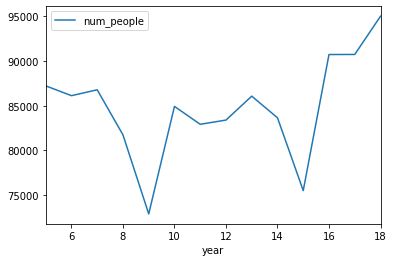

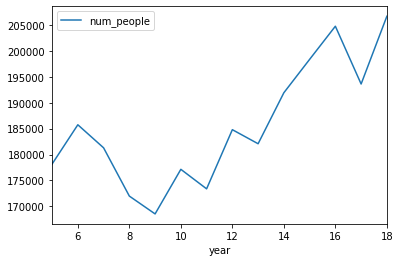

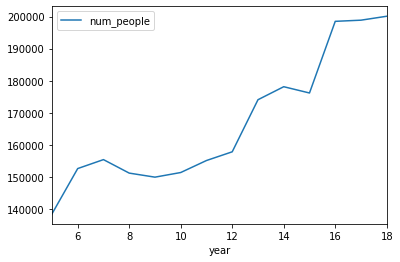

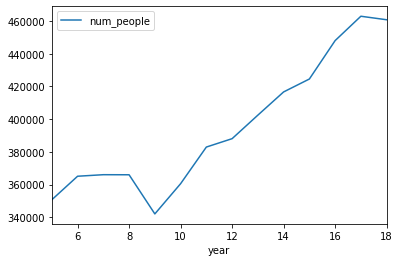

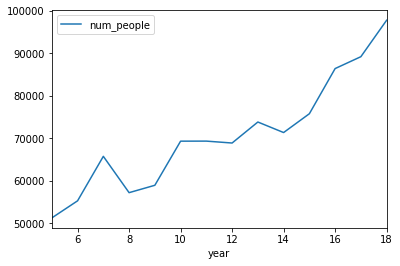

...

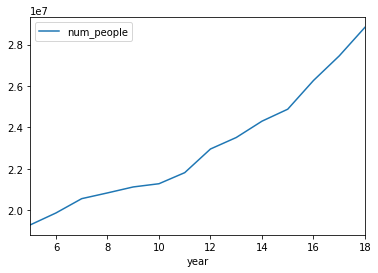

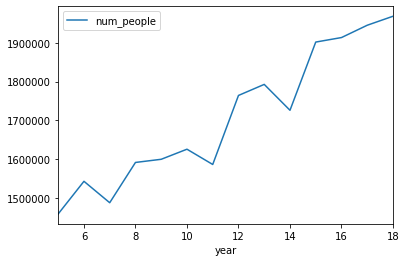

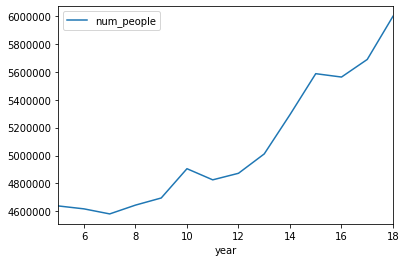

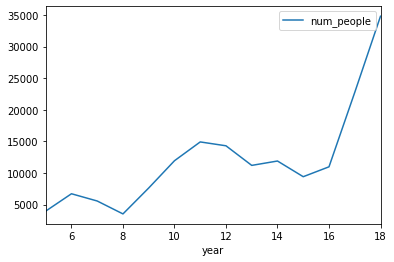

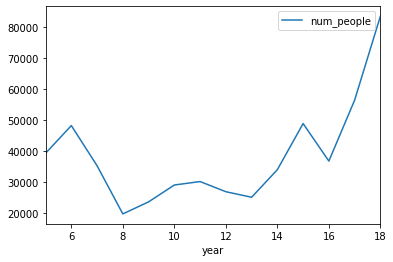

In [78]:
i = 1
for dataFrame in dataFrames:    
    name = 'num_{}.png'.format(i)
    functions.save_image_with_params(dataFrame, name, x = 'year', y = 'num_people')
    i = i + 1    